# Time Delay Accuracy and Precision

_Phil Marshall & Lynne Jones_

In the first [Time Delay Challenge](http://timedelaychallenge.org) paper, [Liao et al (2015)](http://arxiv.org/pdf/1409.1254.pdf) derived the following simple model for how strongly gravitationally lensed quasar time delay accuracy (A), precision (P) and success rate (f) depend on the night-to-night cadence, season and campaign length. 
wrote several metrics and stackers to determine time delay accuracy (A), precision (P) and success rate (f). 

\begin{align}
|A|_{\rm model} &\approx 0.06\% \left(\frac{\rm cad} {\rm 3 days}  \right)^{0.0}
                          \left(\frac{\rm sea}  {\rm 4 months}\right)^{-1.0}
                          \left(\frac{\rm camp}{\rm 5 years} \right)^{-1.1} \notag \\
  P_{\rm model} &\approx 4.0\% \left(\frac{\rm cad} {\rm 3 days}  \right)^{ 0.7}
                         \left(\frac{\rm sea}  {\rm 4 months}\right)^{-0.3}
                         \left(\frac{\rm camp}{\rm 5 years} \right)^{-0.6} \notag \\
  f_{\rm model} &\approx 30\% \left(\frac{\rm cad} {\rm 3 days}  \right)^{-0.4}
                        \left(\frac{\rm sea}  {\rm 4 months}\right)^{ 0.8}
                        \left(\frac{\rm camp}{\rm 5 years} \right)^{-0.2} \notag
\end{align}

The first two of these metrics are candidate Figure of Merit proxies, while one can imagine combining all three somehow to provide an approximate dark energy parameter Figuer of Merit. These three metrics are implemented in [`tdcMetric.py`](http://github.com/LSST-nonproject/sims_maf_contrib/tree/master/mafContrib/tdcMetric.py) of the  [sims_maf_contrib](http://github.com/LSST-nonproject/sims_maf_contrib) git repository. 

This notebook provides a demo calculation of these metrics, using the MAF python interface (requires sims_maf version >= 1.0). 

## Getting Started

You'll need the `sims_maf_contrib` folder on your `PYTHONPATH`. For me, that meant doing:
```bash
export PYTHONPATH=$PYTHONPATH:/home/tanguita/GoogleDrive/Work/Projects/LSST/sims_maf_contrib2
```

In [57]:
import matplotlib.pyplot as plt
%matplotlib inline
# Import MAF modules.
import lsst.sims.maf.db as db
import lsst.sims.maf.slicers as slicers
import lsst.sims.maf.metrics as metrics
import lsst.sims.maf.stackers as stackers
import lsst.sims.maf.plots as plots
from lsst.sims.maf.metricBundles import MetricBundle, MetricBundleGroup
# Import the contributed metrics and stackers 
import mafContrib

## Setting up  the MAF Evaluation of the Baseline Cadence 

As usual, we need to set up a `MetricBundleGroup` object so that we can run all of the metrics it contains on a single `OpSim` output database, which we first have to connect to. The easiest way I found to do this is to link my copy of the database to the current working directory.

In [58]:
runName = 'baseline_2018a'
#runName = '/home/tanguita/lsst/opsims/mothra_2045'
PATH='/Drives/data2/opsim/'

In [59]:
database = PATH+ runName + '.db'
opsdb = db.OpsimDatabase(database)
outDir = 'tmp'

Instantiate the metrics, stackers and slicer that we want to use. These are the TDC metrics, the season stacker, and the healpix slicer. Actually, since we'll just use the stackers in their default configuration, we don't need to explicitly instantiate the stackers -- MAF will handle that for us.  
Note that our metric (`TdcMetric`) is actually a "complex" metric, as it calculates A, P, and f in one go (thus re-using the cadence/season/campaign values which must also be calculated for each set of visits), and then has 'reduce' methods that separate each of these individual results into separate values. 

In [60]:
metric = mafContrib.TdcMetric(metricName='TDC', seasonCol='season', expMJDCol='observationStartMJD', nightCol='night')
slicer = slicers.HealpixSlicer(nside=64, lonCol='fieldRA', latCol='fieldDec')

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


Let's set the plotFuncs so that we only create the skymap and histogram for each metric result. This is an optional step - otherwise, we'd just make the angular power spectra plots too. 

In [61]:
plotFuncs = [plots.HealpixSkyMap, plots.HealpixHistogram]
slicer.plotFuncs = plotFuncs

The last ingredient we need is an SQL query to define the subset of visits we are interested in. Let's do something quick, like just the _i_ band in the first three years.

In [62]:
sqlconstraint = 'night < %i and filter = "i"' % (3*365.25)
tdcBundle = MetricBundle(metric=metric, slicer=slicer, sqlconstraint=sqlconstraint, runName=runName)

/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


In [63]:
resultsDb = db.ResultsDb(outDir=outDir)
bdict = {'tdc':tdcBundle}
bgroup = MetricBundleGroup(bdict, opsdb, outDir=outDir, resultsDb=resultsDb)

## Running the Metrics and Working with the Results

We can query the database, run the stackers, run the metric calculation, and run the reduce functions with `runAll`. This would also generate summary statistics if we had defined any.

In [64]:
bgroup.runAll()

Querying database SummaryAllProps with constraint night < 1095 and filter = "i" for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']
Found 131270 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


Note that we now have more bundles in our bundle dictionary. These new bundles contain the results of the reduce functions - so, the metrics A, P, f separately as well as the "cadence", "season" and "campaign" diagnostics. 

In [65]:
bdict.keys()

dict_keys(['tdc', 'TDC_Accuracy', 'TDC_Cadence', 'TDC_Campaign', 'TDC_Precision', 'TDC_Rate', 'TDC_Season'])

We want to set the `plotDict` for each of these separately, so that we can get each plot to look "just right", and then we'll make the plots.

In [66]:
minVal = 0.01
maxVal = {'Accuracy':0.4, 'Precision':100.0, 'Rate':40, 'Cadence':14, 'Season':8.0, 'Campaign':11.0}
units = {'Accuracy':'%', 'Precision':'%', 'Rate':'%', 'Cadence':'days', 'Season':'months', 'Campaign':'years'}
for key in maxVal:
    plotDict = {'xMin':minVal, 'xMax':maxVal[key], 'colorMin':minVal, 'colorMax':maxVal[key]}
    plotDict['xlabel'] = 'TDC %s (%s)' % (key, units[key])
    bdict['TDC_%s' % (key)].setPlotDict(plotDict)

Plotting figures with "night < 1095 and filter = "i"" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 27464 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 237 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:58: RuntimeWarning: divi

Plotting complete.


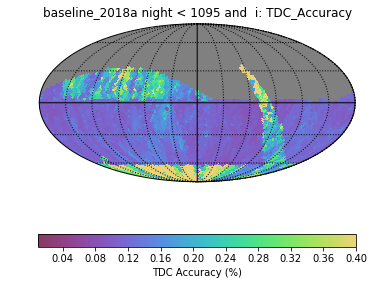

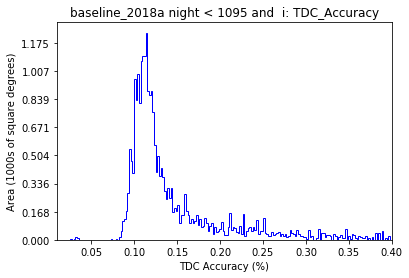

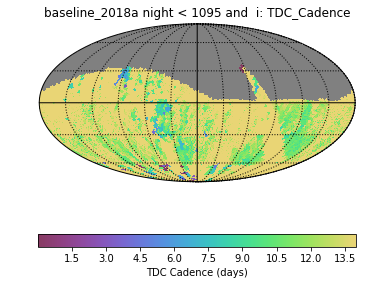

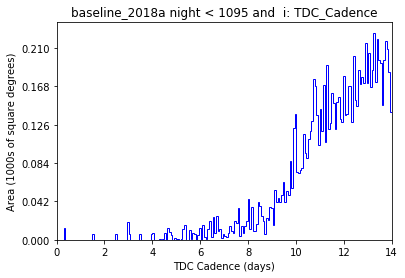

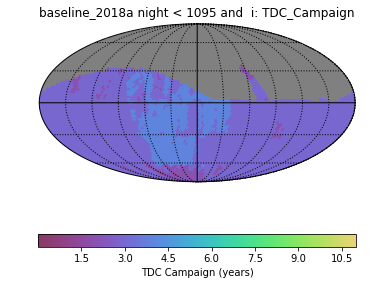

...

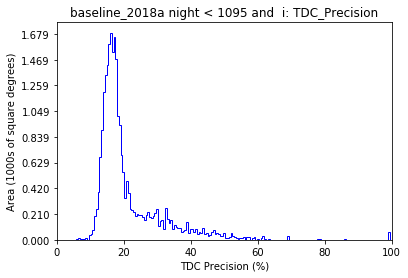

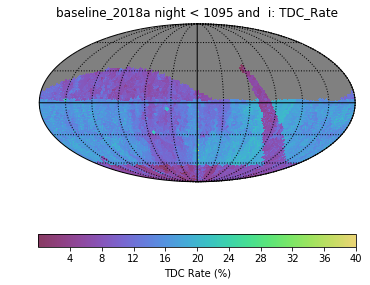

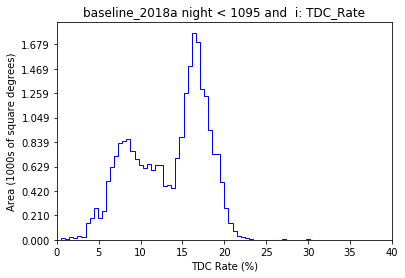

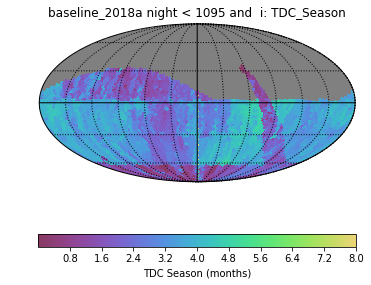

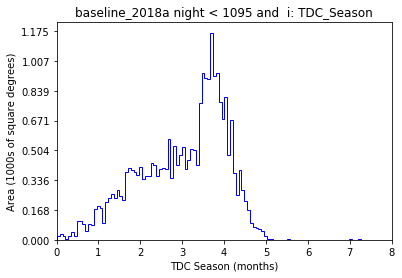

In [67]:
bgroup.plotAll(closefigs=False)

The `tdcBundle.metricValues` array contains the `HEALPix` maps of each metric.

In [68]:
tdcBundle.metricValues

masked_array(data=[--, --, --, ...,
                   {'accuracy': 0.4406674503748691, 'precision': 38.47634522899015, 'rate': 7.280892646800195, 'cadence': 22.75, 'season': 1.4922248858447371, 'campaign': 2},
                   {'accuracy': 0.4406674503748691, 'precision': 38.47634522899015, 'rate': 7.280892646800195, 'cadence': 22.75, 'season': 1.4922248858447371, 'campaign': 2},
                   {'accuracy': 0.09466325652241131, 'precision': 30.219930842552728, 'rate': 13.323618155153252, 'cadence': 36.416666666666664, 'season': 4.446962075088849, 'campaign': 3}],
             mask=[ True,  True,  True, ..., False, False, False],
       fill_value=-1.6375e+30,
            dtype=object)

Let's do some post-processing to turn the metric maps into single numbers for a table in the observing strategy white paper.

In [69]:
import numpy as np
x = tdcBundle.metricValues
index = np.where(x.mask == False)

In [70]:
f = np.array([each['rate'] for each in x[index]])
A = np.array([each['accuracy'] for each in x[index]])
P = np.array([each['precision'] for each in x[index]])
c = np.array([each['cadence'] for each in x[index]])
s = np.array([each['season'] for each in x[index]])
y = np.array([each['campaign'] for each in x[index]])
print(np.mean(f), np.mean(A), np.mean(P), np.mean(c), np.mean(s), np.mean(y))

13.35998332957616 0.44409922100259935 21.16991877949257 18.30061941590279 3.0097206947427746 3.1381361108432184


We are only interested in lenses with high accuracy delays, i.e. the fraction of the survey area where the _A_ metric is below some threshold. We can turn this into a sky area if we know the average size of a `HEALPix` pixel.

In [72]:
accuracy_threshold = 0.2 # 5 times better than threshold of 0.2% set by Hojjati & Linder (2014).

high_accuracy = np.where(A < accuracy_threshold)
high_fraction = 100*(1.0*len(A[high_accuracy]))/(1.0*len(A))
print("Fraction of total survey area providing high accuracy time delays = ",np.round(high_fraction,1),'%')

high_accuracy_cadence = np.median(c[high_accuracy])
print("Median night-to-night cadence in high accuracy regions = ",np.round(high_accuracy_cadence,1),'days')

high_accuracy_season = np.median(s[high_accuracy])
print("Median season length in high accuracy regions = ",np.round(high_accuracy_season,1),'months')

high_accuracy_campaign = np.median(y[high_accuracy])
print("Median campaign length in high accuracy regions = ",int(high_accuracy_campaign),'years')

Fraction of total survey area providing high accuracy time delays =  81.0 %
Median night-to-night cadence in high accuracy regions =  14.7 days
Median season length in high accuracy regions =  3.5 months
Median campaign length in high accuracy regions =  3 years


In [73]:
Nside = 64
Npix = 12*Nside**2
Area_per_pixel = 4*np.pi / float(Npix) # steradians
Area_per_pixel *= (180.0/np.pi)*(180.0/np.pi) # square degrees
high_accuracy_area = len(A[high_accuracy])*Area_per_pixel
print("Area of sky providing high accuracy time delays = ",int(high_accuracy_area),"sq deg")

Area of sky providing high accuracy time delays =  21156 sq deg


In [74]:
precision_per_lens = np.array([np.mean(P[high_accuracy]),4.0])
precision_per_lens = np.sqrt(np.sum(precision_per_lens*precision_per_lens))
print("Mean precision per lens in high accuracy sample, including modeling error = ",np.round(precision_per_lens,2),'%')

fraction = np.mean(f[high_accuracy])
N_lenses = int((high_accuracy_area/18000.0) * (fraction/30.0) * 400)
print("Number of lenses in high accuracy sample = ",N_lenses)

distance_precision = (precision_per_lens * (N_lenses > 0)) / (np.sqrt(N_lenses) + (N_lenses == 0))
print("Maximum combined percentage distance precision (as in Coe & Moustakas 2009) = ",np.round(distance_precision,2),'%')

Mean precision per lens in high accuracy sample, including modeling error =  19.51 %
Number of lenses in high accuracy sample =  232
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  1.28 %


The above overall precision can be related to the cosmological parameter precision, and so is a reasonable proxy Figure of Merit. This quantity is plotted by [Treu & Marshall (2016)](http://arxiv.org/abs/1605.05333) in their recent review: their target for the LSST era is between 0.4 and 0.7%.

The above analysis can all be repeated for alternative `OpSim` runs and SQL constraints, as we now show.

## Investigating Multiple `OpSim` Outputs

Since we want to compare several runs, and draw conclusions about which observing strategy is best, let's make a function that does all this for us, given a specified `OpSim` run name and an SQL query to select just the filters we want (either all, or just _r_ and _i_). This is just all the code we just wrote, but packed into a `def`.

### Method

In [75]:
def evaluate_opsim_run_for_time_delay_performance(runName='baseline2018a', filters='ugrizy', Nyears=10):
    '''
    Sets up and executes a MAF analysis based on the Time Delay Challenge metrics.
    
    Parameters
    ----------
    runName : string ('minion_2016')
        The name of an OpSim simulation, whose output database will be used.
    filters : string ('ugrizy')
        List of bands to be used in analysis.
    Nyears : int
        No. of years in campaign to be used in analysis, starting from night 0.
        
    Returns
    -------
    results : dict
        Various summary statistics
    
    Notes
    -----

    '''
    # Set up some of the metadata, and connect to the OpSim database. 
    PATH='/Drives/data2/opsim/'
    database = PATH + runName + '.db'
    opsdb = db.OpsimDatabase(database)
    
    # Instantiate the metrics, stackers and slicer that we want to use. 
    # These are the TDC metrics, the season stacker, and the healpix slicer. 
    # Actually, since we'll just use the stackers in their default configuration, we don't need to 
    # explicitly instantiate the stackers -- MAF will handle that for us.  
    # Note that the metric (TdcMetric) is actually a "complex" metric, as it calculates A, P, and f 
    # all in one go (thus re-using the cadence/season/campaign values which must also be calculated
    # for each set of visits), and then has 'reduce' methods that separate each of these individual
    # results into separate values. 
    metric = mafContrib.TdcMetric(metricName='TDC', seasonCol='season', expMJDCol='observationStartMJD', nightCol='night')
    slicer = slicers.HealpixSlicer(nside=64, lonCol='fieldRA', latCol='fieldDec')
    
    # Set the plotFuncs so that we only create the skymap and histogram for each metric result 
    # (we're not interested in the power spectrum). 
    plotFuncs = [plots.HealpixSkyMap, plots.HealpixHistogram]
    slicer.plotFuncs = plotFuncs
    
    # Write the SQL constraint:
    sql = 'night < %i' % (365.25*Nyears)
    sqlstring = str(Nyears)+'years-'
    if filters == 'ugrizy':
        sql += ''
        sqlstring += 'ugrizy'
    elif filters == 'i':
        sql += ' and (filter="i")'
        sqlstring += 'i-only'
    elif filters == 'ri':
        sql += ' and (filter="ri")'
        sqlstring += 'ri-only'
    else:
        raise ValueError('Unrecognised filter set '+filters)

    # Set the output directory name:
    outDir = 'output_'+runName+'_'+sqlstring
    
    # Now bundle everything up:
    tdcBundle = MetricBundle(metric=metric, slicer=slicer, sqlconstraint=sql, runName=runName)
    resultsDb = db.ResultsDb(outDir=outDir)
    bdict = {'tdc':tdcBundle}
    bgroup = MetricBundleGroup(bdict, opsdb, outDir=outDir, resultsDb=resultsDb)

    # And run the metrics!
    bgroup.runAll()
    
    # Now to make the plots. 
    # Note that we now have more bundles in our bundle dictionary - these new bundles contain 
    # the results of the reduce functions - so, A/P/f separately:
    #     bdict.keys() => ['tdc', 'TDC_Rate', 'TDC_Precision', 'TDC_Accuracy', 'TDC_Cadence', 'TDC_Campaign', 'TDC_Season']
    # We want to set the plotDict for each of these separately, so that we can get each plot 
    # to look "just right", and then we'll make the plots.   
    minVal = 0.01
    maxVal = {'Accuracy':0.2, 'Precision':20.0, 'Rate':40, 'Cadence':14, 'Season':8.0, 'Campaign':11.0}
    units = {'Accuracy':'%', 'Precision':'%', 'Rate':'%', 'Cadence':'days', 'Season':'months', 'Campaign':'years'}
    for key in maxVal:
        plotDict = {'xMin':minVal, 'xMax':maxVal[key], 'colorMin':minVal, 'colorMax':maxVal[key]}
        plotDict['xlabel'] = 'TDC %s (%s)' % (key, units[key])
        bdict['TDC_%s' % (key)].setPlotDict(plotDict)
    
    bgroup.plotAll(closefigs=False)
    
    # Now pull out metric values so that we can compute some useful summaries: 
    import numpy as np
    x = tdcBundle.metricValues
    index = np.where(x.mask == False)
    f = np.array([each['rate'] for each in x[index]])
    A = np.array([each['accuracy'] for each in x[index]])
    P = np.array([each['precision'] for each in x[index]])
    c = np.array([each['cadence'] for each in x[index]])
    s = np.array([each['season'] for each in x[index]])
    y = np.array([each['campaign'] for each in x[index]])

    # Summaries:
    results = dict()
    results['runName'] = runName
    results['filters'] = filters
    results['Nyears'] = Nyears
    print(runName,filters,Nyears)
    accuracy_threshold = 0.2 # Threshold of 0.2% set by Hojjati & Linder (2014).
    high_accuracy = np.where(A < accuracy_threshold)
    results['high_accuracy_area_fraction'] = 100*(1.0*len(A[high_accuracy]))/(1.0*len(A))
    print("Fraction of total survey area providing high accuracy time delays = ",np.round(results['high_accuracy_area_fraction'],1),'%')

    results['high_accuracy_cadence'] = np.median(c[high_accuracy])
    print("Median night-to-night cadence in high accuracy regions = ",np.round(results['high_accuracy_cadence'],1),'days')

    results['high_accuracy_season'] = np.median(s[high_accuracy])
    print("Median season length in high accuracy regions = ",np.round(results['high_accuracy_season'],1),'months')

    results['high_accuracy_campaign'] = np.median(y[high_accuracy])
    print("Median campaign length in high accuracy regions = ",int(results['high_accuracy_campaign']),'years')

    Nside = 64
    Npix = 12*Nside**2
    Area_per_pixel = 4*np.pi / float(Npix) # steradians
    Area_per_pixel *= (180.0/np.pi)*(180.0/np.pi) # square degrees
    results['high_accuracy_area'] = len(A[high_accuracy])*Area_per_pixel
    print("Area of sky providing high accuracy time delays = ",int(results['high_accuracy_area']),"sq deg")

    precision_per_lens = np.array([np.mean(P[high_accuracy]),4.0])
    results['precision_per_lens'] = np.sqrt(np.sum(precision_per_lens*precision_per_lens))
    print("Mean precision per lens in high accuracy sample, including modeling error = ",np.round(results['precision_per_lens'],2),'%')

    fraction = np.mean(f[high_accuracy])
    results['N_lenses'] = int((results['high_accuracy_area']/18000.0) * (fraction/30.0) * 400)
    print("Number of lenses in high accuracy sample = ",results['N_lenses'])
 
    results['distance_precision'] = results['precision_per_lens'] / np.sqrt(results['N_lenses'])
    print("Maximum combined percentage distance precision (as in Coe & Moustakas 2009) = ",np.round(results['distance_precision'],2),'%')

    return results

### Results

We'll save all our results in a single array, so that it can be used to make a `latex` table at the end.

In [76]:
listop=['astro-lsst-01_2039','baseline_2018a','colossus_2664','colossus_2665','colossus_2667','kraken_2026','kraken_2035','kraken_2036','kraken_2042','kraken_2044','mothra_2045','mothra_2049','nexus_2097','pontus_2002','pontus_2489','pontus_2502']
listop=['rolling_10yrs_opsim','rolling_mix_10yrs_opsim','alt_sched','alt_sched_rolling']

In [77]:
results = []

In [78]:
for i in listop:
    print(i)

rolling_10yrs_opsim
rolling_mix_10yrs_opsim
alt_sched
alt_sched_rolling


####10 years, ugrizy

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 365 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 206978 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 9777 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 366 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))


Plotting complete.
rolling_10yrs_opsim ugrizy 1
Fraction of total survey area providing high accuracy time delays =  15.3 %
Median night-to-night cadence in high accuracy regions =  3.3 days
Median season length in high accuracy regions =  3.6 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  4155 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  10.02 %
Number of lenses in high accuracy sample =  103
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.99 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 365 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 202368 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 12311 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 313 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: Mor

Plotting complete.
rolling_mix_10yrs_opsim ugrizy 1
Fraction of total survey area providing high accuracy time delays =  13.9 %
Median night-to-night cadence in high accuracy regions =  3.5 days
Median season length in high accuracy regions =  3.6 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  3784 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  10.44 %
Number of lenses in high accuracy sample =  91
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  1.09 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Querying database SummaryAllProps with constraint night < 365 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']
Found 217116 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 52843 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tang

Plotting complete.
alt_sched ugrizy 1
Fraction of total survey area providing high accuracy time delays =  0.9 %
Median night-to-night cadence in high accuracy regions =  7.4 days
Median season length in high accuracy regions =  4.6 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  188 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  16.04 %
Number of lenses in high accuracy sample =  3
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  9.26 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 365 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 213366 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 52431 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tang

Plotting complete.
alt_sched_rolling ugrizy 1
Fraction of total survey area providing high accuracy time delays =  0.9 %
Median night-to-night cadence in high accuracy regions =  4.8 days
Median season length in high accuracy regions =  4.8 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  99 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  13.62 %
Number of lenses in high accuracy sample =  2
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  9.63 %


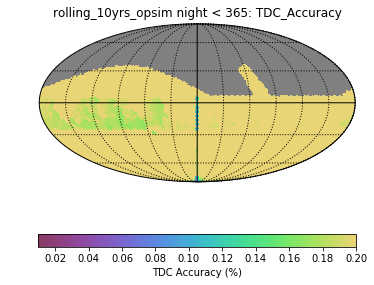

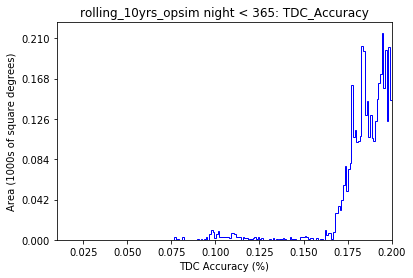

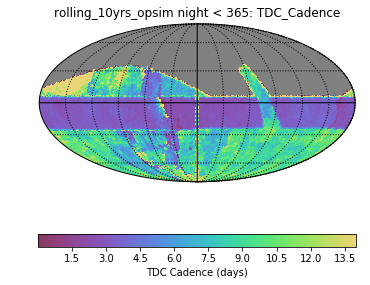

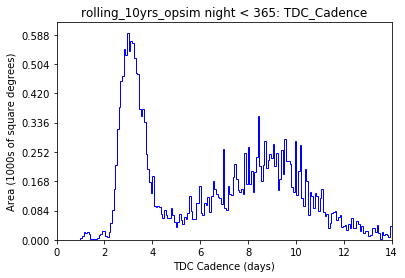

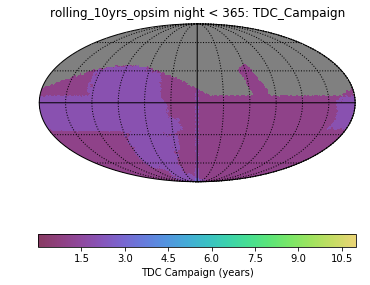

...

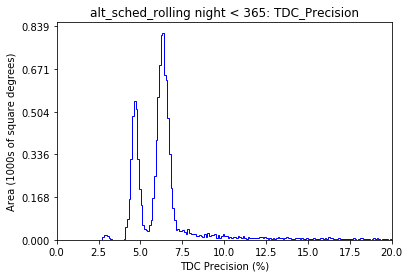

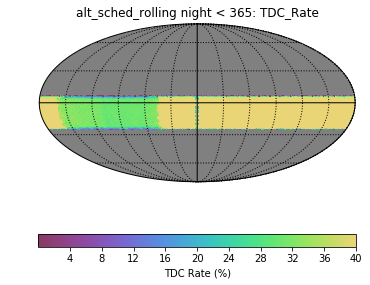

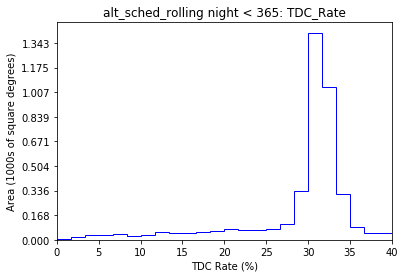

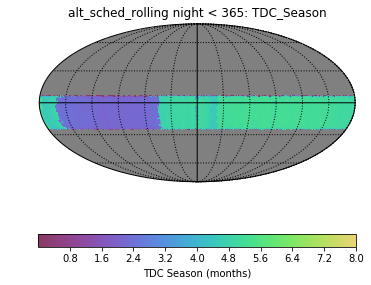

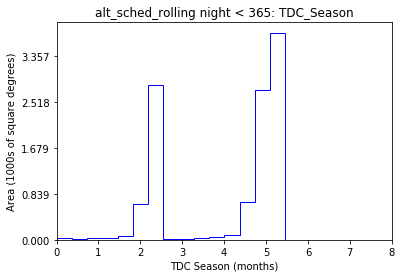

In [79]:
for i in listop:
    results.append(evaluate_opsim_run_for_time_delay_performance(runName=i, Nyears=1, filters='ugrizy'))
    
    

####5 years, ugrizy

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 1137829 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 70969 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 402 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal

Plotting complete.
rolling_10yrs_opsim ugrizy 5
Fraction of total survey area providing high accuracy time delays =  98.9 %
Median night-to-night cadence in high accuracy regions =  6.6 days
Median season length in high accuracy regions =  5.1 months
Median campaign length in high accuracy regions =  5 years
Area of sky providing high accuracy time delays =  27022 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  8.06 %
Number of lenses in high accuracy sample =  513
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.36 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 1108265 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 74979 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 816 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal

Plotting complete.
rolling_mix_10yrs_opsim ugrizy 5
Fraction of total survey area providing high accuracy time delays =  98.9 %
Median night-to-night cadence in high accuracy regions =  6.8 days
Median season length in high accuracy regions =  5.1 months
Median campaign length in high accuracy regions =  5 years
Area of sky providing high accuracy time delays =  27027 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  8.22 %
Number of lenses in high accuracy sample =  508
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.36 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 1027344 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 293575 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tan

Plotting complete.
alt_sched ugrizy 5
Fraction of total survey area providing high accuracy time delays =  99.1 %
Median night-to-night cadence in high accuracy regions =  3.4 days
Median season length in high accuracy regions =  4.9 months
Median campaign length in high accuracy regions =  5 years
Area of sky providing high accuracy time delays =  21329 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  5.88 %
Number of lenses in high accuracy sample =  494
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.26 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 1024348 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 31603 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tang

Plotting complete.
alt_sched_rolling ugrizy 5
Fraction of total survey area providing high accuracy time delays =  99.0 %
Median night-to-night cadence in high accuracy regions =  1.7 days
Median season length in high accuracy regions =  4.9 months
Median campaign length in high accuracy regions =  3 years
Area of sky providing high accuracy time delays =  21318 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  5.64 %
Number of lenses in high accuracy sample =  647
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.22 %


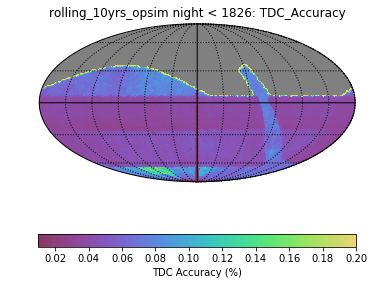

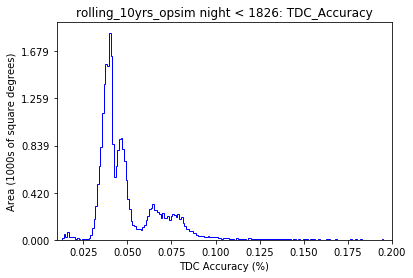

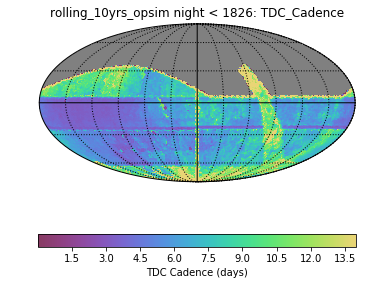

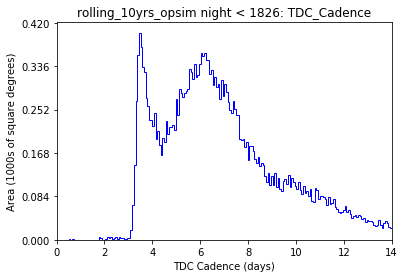

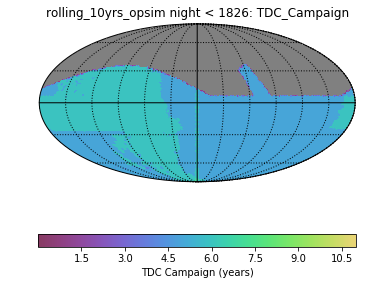

...

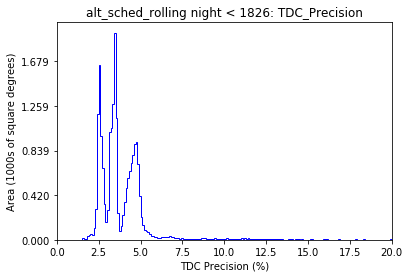

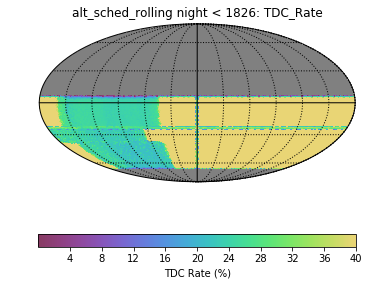

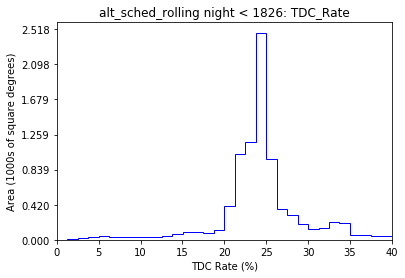

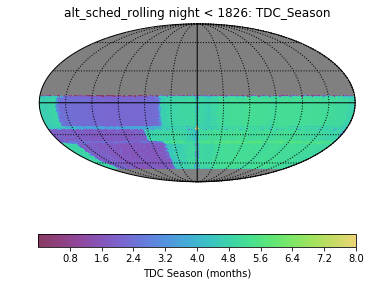

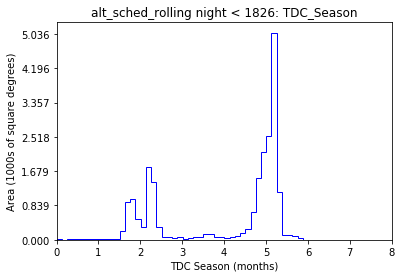

In [80]:
for i in listop:
    results.append(evaluate_opsim_run_for_time_delay_performance(runName=i, Nyears=5, filters='ugrizy'))


####10 years, i

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Querying database SummaryAllProps with constraint night < 365 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']
Found 43861 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 2046 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))


Plotting complete.
rolling_10yrs_opsim i 1
Fraction of total survey area providing high accuracy time delays =  2.1 %
Median night-to-night cadence in high accuracy regions =  17.8 days
Median season length in high accuracy regions =  3.4 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  566 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  26.3 %
Number of lenses in high accuracy sample =  6
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  10.74 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 365 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 40179 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 2024 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tangu

Plotting complete.
rolling_mix_10yrs_opsim i 1
Fraction of total survey area providing high accuracy time delays =  1.8 %
Median night-to-night cadence in high accuracy regions =  11.6 days
Median season length in high accuracy regions =  3.5 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  480 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  21.14 %
Number of lenses in high accuracy sample =  7
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  7.99 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 365 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 40368 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 26256 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tang

Plotting complete.
alt_sched i 1
Fraction of total survey area providing high accuracy time delays =  0.5 %
Median night-to-night cadence in high accuracy regions =  19.5 days
Median season length in high accuracy regions =  3.8 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  96 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  28.81 %
Number of lenses in high accuracy sample =  1
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  28.81 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Querying database SummaryAllProps with constraint night < 365 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']
Found 38988 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 365 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 35343 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tang

Plotting complete.
alt_sched_rolling i 1
Fraction of total survey area providing high accuracy time delays =  0.7 %
Median night-to-night cadence in high accuracy regions =  9.6 days
Median season length in high accuracy regions =  4.4 months
Median campaign length in high accuracy regions =  2 years
Area of sky providing high accuracy time delays =  76 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  19.23 %
Number of lenses in high accuracy sample =  1
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  19.23 %


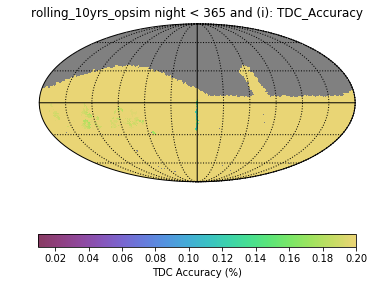

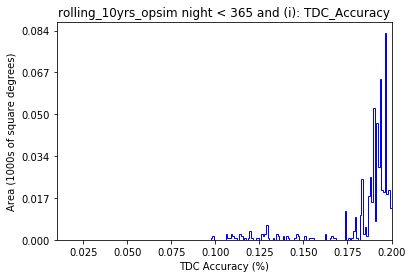

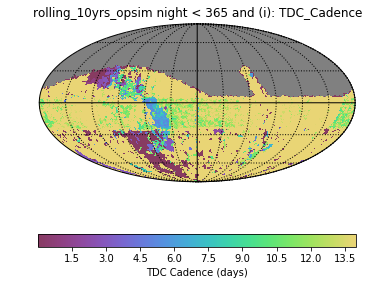

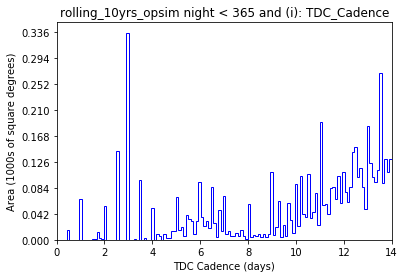

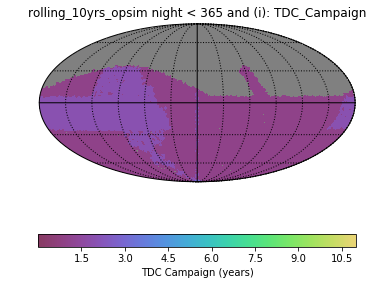

...

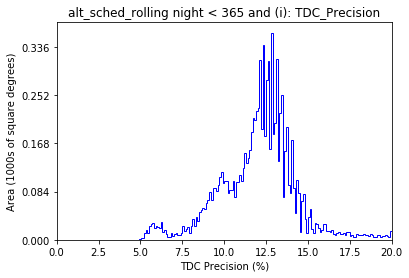

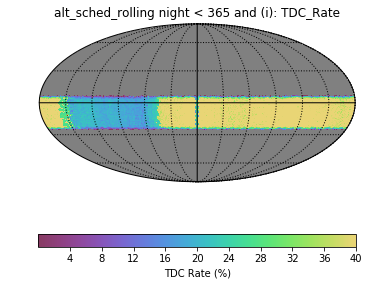

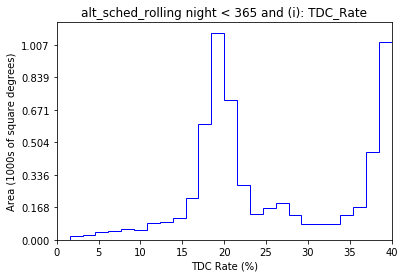

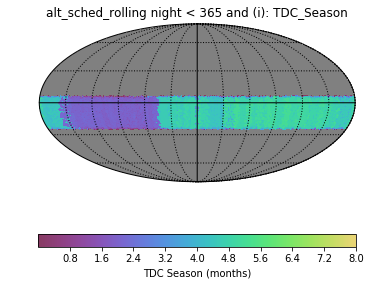

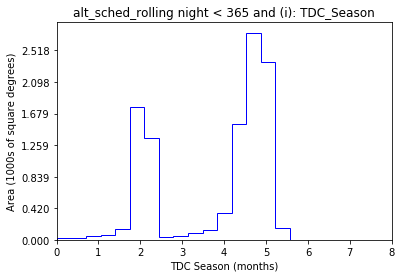

In [81]:
for i in listop:
    results.append(evaluate_opsim_run_for_time_delay_performance(runName=i, Nyears=1, filters='i'))


####5 years, i

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 254412 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 31418 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 371 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal

Plotting complete.
rolling_10yrs_opsim i 5
Fraction of total survey area providing high accuracy time delays =  7.9 %
Median night-to-night cadence in high accuracy regions =  19.0 days
Median season length in high accuracy regions =  5.5 months
Median campaign length in high accuracy regions =  6 years
Area of sky providing high accuracy time delays =  2153 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  13.99 %
Number of lenses in high accuracy sample =  29
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  2.6 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 241623 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 34331 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 362 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal

Plotting complete.
rolling_mix_10yrs_opsim i 5
Fraction of total survey area providing high accuracy time delays =  13.2 %
Median night-to-night cadence in high accuracy regions =  13.5 days
Median season length in high accuracy regions =  5.8 months
Median campaign length in high accuracy regions =  6 years
Area of sky providing high accuracy time delays =  3598 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  11.34 %
Number of lenses in high accuracy sample =  57
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  1.5 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 189361 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 194736 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tan

Plotting complete.
alt_sched i 5
Fraction of total survey area providing high accuracy time delays =  1.1 %
Median night-to-night cadence in high accuracy regions =  26.5 days
Median season length in high accuracy regions =  11.2 months
Median campaign length in high accuracy regions =  6 years
Area of sky providing high accuracy time delays =  238 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  13.04 %
Number of lenses in high accuracy sample =  4
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  6.52 %
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 and (filter="i") for columns ['observationStartMJD', 'night', 'fieldDec', 'fieldRA']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 187170 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 29370 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/tang

Plotting complete.
alt_sched_rolling i 5
Fraction of total survey area providing high accuracy time delays =  0.0 %
Median night-to-night cadence in high accuracy regions =  22.7 days
Median season length in high accuracy regions =  10.7 months
Median campaign length in high accuracy regions =  6 years
Area of sky providing high accuracy time delays =  10 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  13.22 %
Number of lenses in high accuracy sample =  0
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  inf %


/usr/lib/python3/dist-packages/ipykernel_launcher.py:133: RuntimeWarning: divide by zero encountered in double_scalars


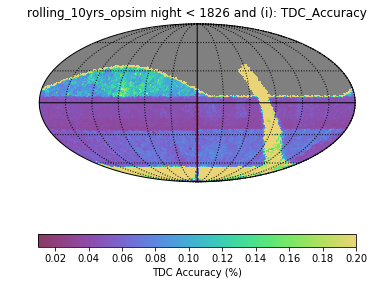

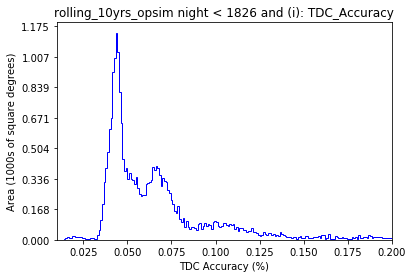

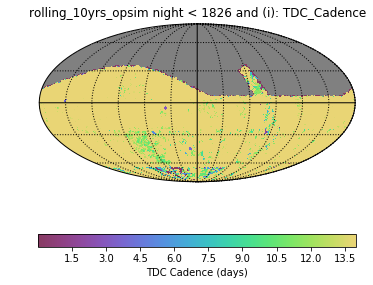

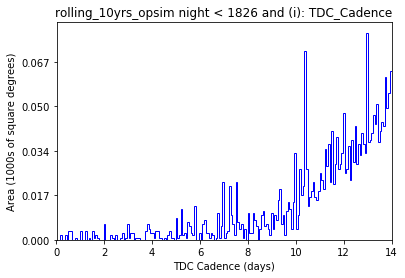

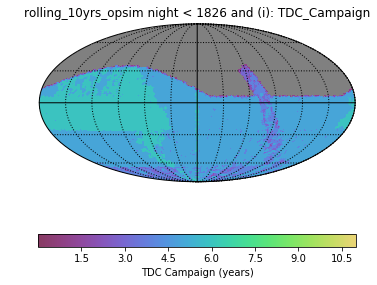

...

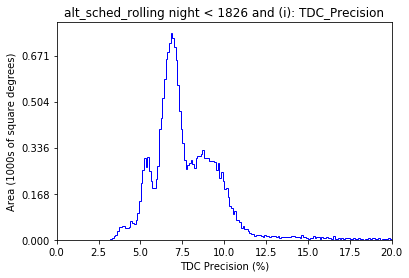

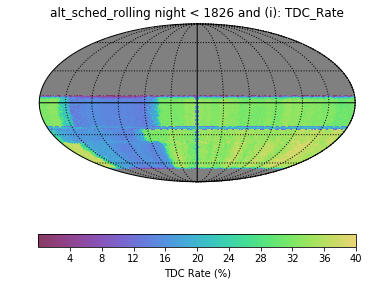

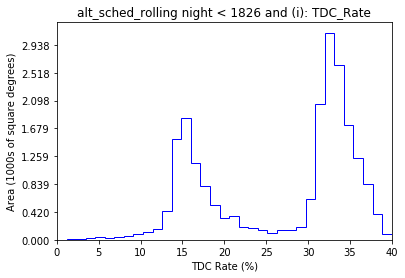

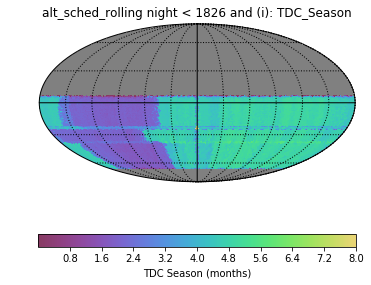

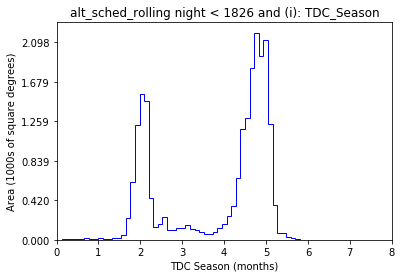

In [56]:
for i in listop:
    results.append(evaluate_opsim_run_for_time_delay_performance(runName=i, Nyears=5, filters='i'))


####10 years, ri

In [60]:
for i in listop:
    results.append(evaluate_opsim_run_for_time_delay_performance(runName=i, Nyears=10, filters='ri'))


Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 3652 and (filter="ri") for columns ['fieldRA', 'fieldDec', 'night', 'observationStartMJD']


/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundleGroup.py:262: UserWarning: No data matching constraint night < 3652 and (filter="ri")
  warnings.warn('No data matching constraint %s' % constraint)
/home/tanguita/lsst/stack/miniconda3-4.5.4-fcd27eb/Linux64/sims_maf/2.10.0.sims/python/lsst/sims/maf/metricBundles/metricBundleGroup.py:266: UserWarning:  This means skipping metrics ['TDC : night < 3652 and (ri) : HealpixSlicer']
  warnings.warn(' This means skipping metrics %s' % metricsSkipped)


KeyError: 'TDC_Accuracy'

####5 years, ri

In [ ]:
for i in listop:
    results.append(evaluate_opsim_run_for_time_delay_performance(runName=i, Nyears=5, filters='ri'))


#### `baseline2018a`: The Baseline Cadence - 10 years, i only

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 3652 and (filter="i") for columns ['night', 'fieldRA', 'observationStartMJD', 'fieldDec']


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 514481 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 3652 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 224 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))
/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/utils/mafUtils.py:58: RuntimeWarning: divide by zero encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make inf bins, returning 200
  warnings.warn('Optimal

Plotting complete.
Fraction of total survey area providing high accuracy time delays =  100.0 %
Median night-to-night cadence in high accuracy regions =  13.8 days
Median season length in high accuracy regions =  3.7 months
Median campaign length in high accuracy regions =  10 years
Area of sky providing high accuracy time delays =  26115 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  10.71 %
Number of lenses in high accuracy sample =  239
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.69 %


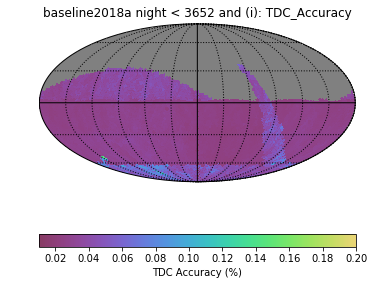

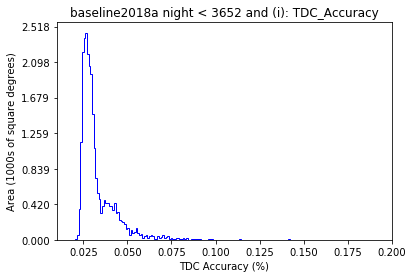

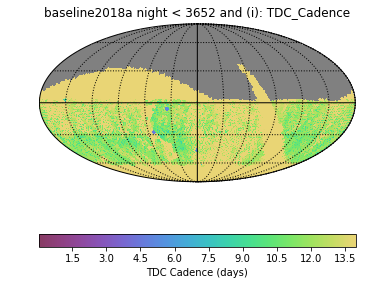

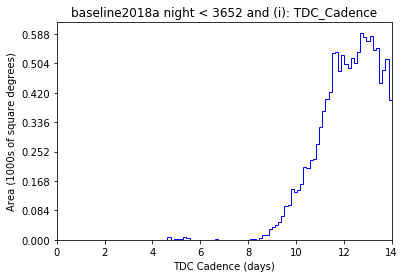

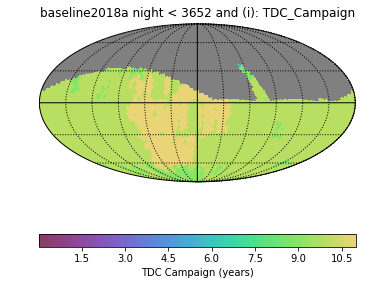

...

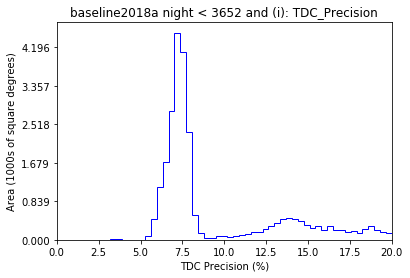

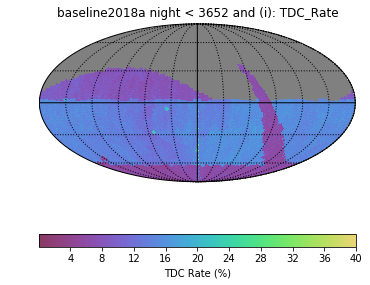

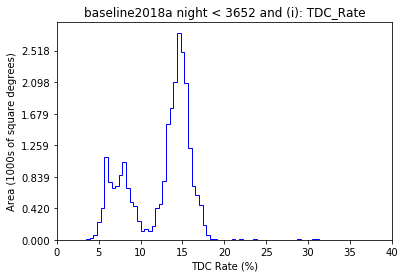

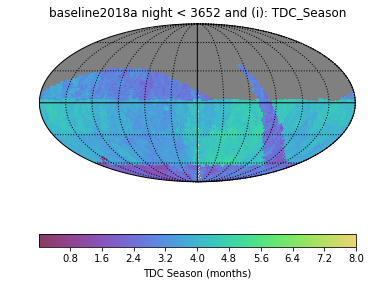

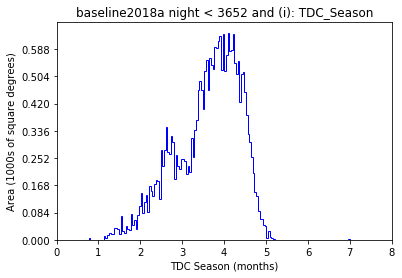

In [69]:
results.append(evaluate_opsim_run_for_time_delay_performance(runName='baseline2018a', Nyears=10, filters='i'))

In [70]:
#### `mothra_2045`: The Baseline Cadence - 10 years, i only

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 3652 and (filter="i") for columns ['night', 'fieldRA', 'observationStartMJD', 'fieldDec']


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 348781 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 3652 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')


Plotting complete.
Fraction of total survey area providing high accuracy time delays =  99.9 %
Median night-to-night cadence in high accuracy regions =  11.0 days
Median season length in high accuracy regions =  2.6 months
Median campaign length in high accuracy regions =  7 years
Area of sky providing high accuracy time delays =  26077 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  10.75 %
Number of lenses in high accuracy sample =  256
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.67 %


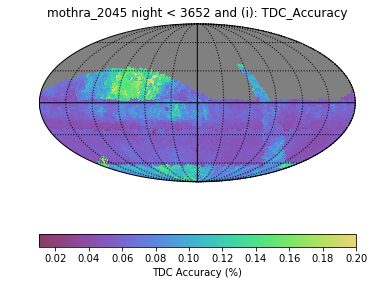

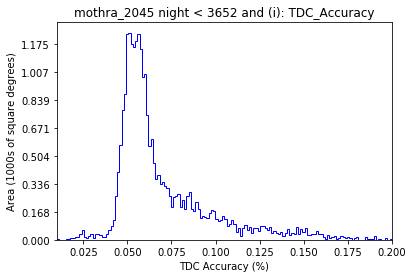

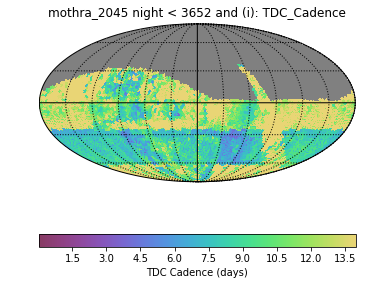

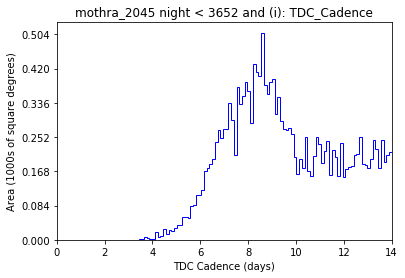

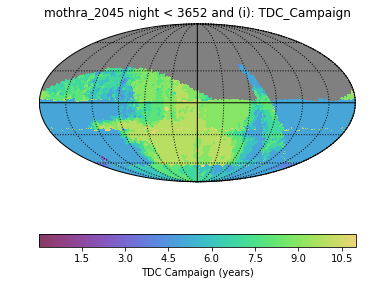

...

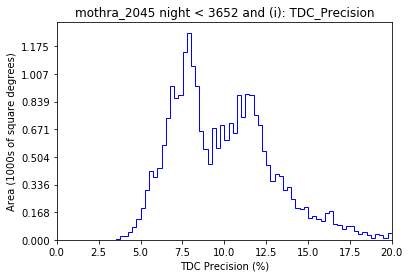

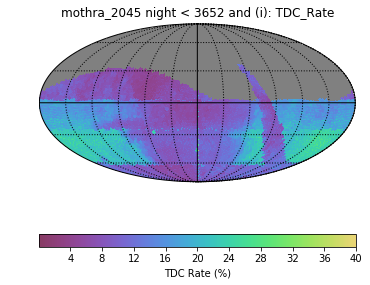

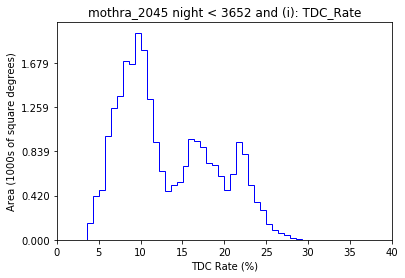

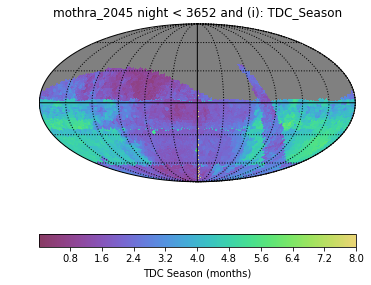

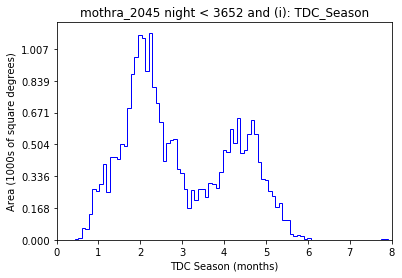

In [71]:
results.append(evaluate_opsim_run_for_time_delay_performance(runName='mothra_2045', Nyears=10, filters='i'))

#### `minion_2016`: The Baseline Cadence - 5 years, r+i only

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 and (filter="r" or filter="i") for columns ['night', 'fieldRA', 'observationStartMJD', 'fieldDec']


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 487941 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826 and (filter="r" or filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 255 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))


Plotting complete.
Fraction of total survey area providing high accuracy time delays =  0.2 %
Median night-to-night cadence in high accuracy regions =  15.4 days
Median season length in high accuracy regions =  11.1 months
Median campaign length in high accuracy regions =  7 years
Area of sky providing high accuracy time delays =  54 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  11.66 %
Number of lenses in high accuracy sample =  1
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  11.66 %


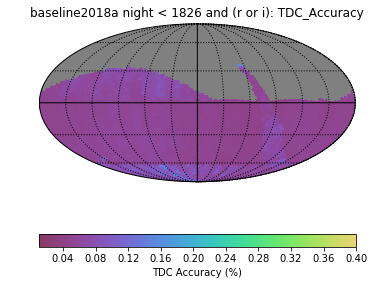

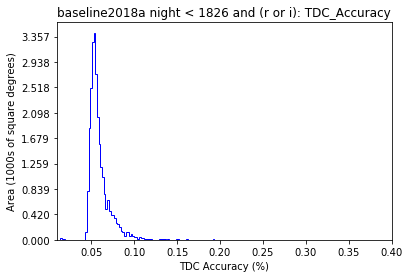

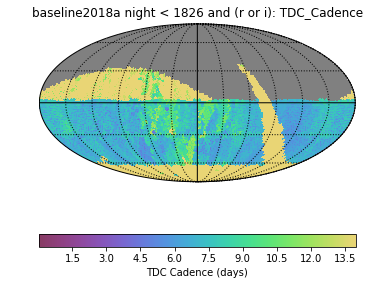

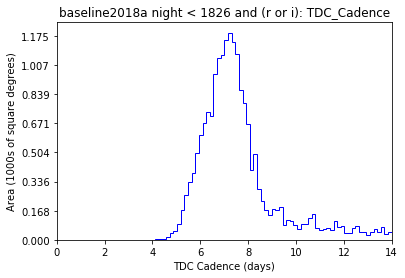

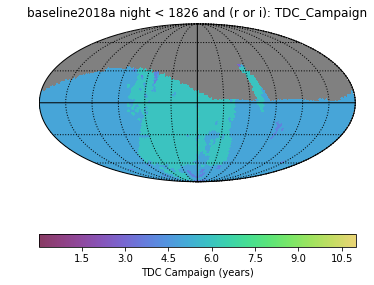

...

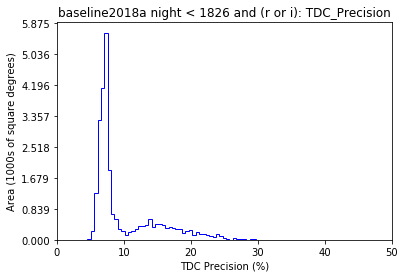

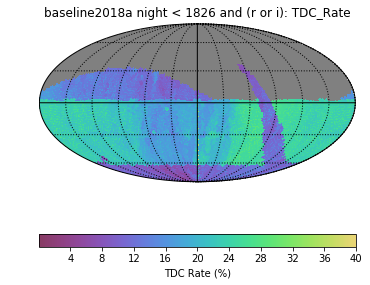

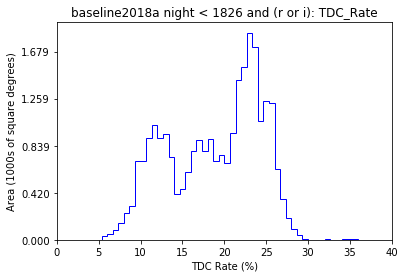

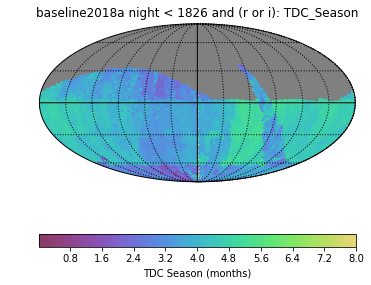

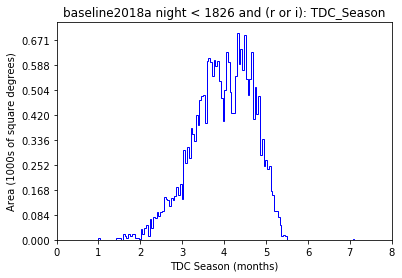

In [48]:
results.append(evaluate_opsim_run_for_time_delay_performance(runName='baseline2018a', Nyears=5, filters='ri'))

#### `kraken_1043`: No Visit Pairs Required - 10 years, ugrizy

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 3652 for columns ['night', 'fieldRA', 'observationStartMJD', 'fieldDec']


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 1799921 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 3652" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')
/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/utils/mafUtils.py:60: UserWarning: Optimal bin calculation tried to make 255 bins, returning 200
  warnings.warn('Optimal bin calculation tried to make %.0f bins, returning %i'%(nbins, nbinMax))


Plotting complete.
Fraction of total survey area providing high accuracy time delays =  65.9 %
Median night-to-night cadence in high accuracy regions =  3.1 days
Median season length in high accuracy regions =  3.6 months
Median campaign length in high accuracy regions =  9 years
Area of sky providing high accuracy time delays =  17205 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  5.52 %
Number of lenses in high accuracy sample =  376
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.28 %


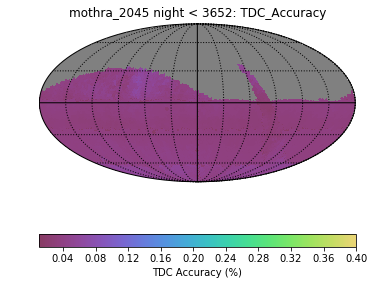

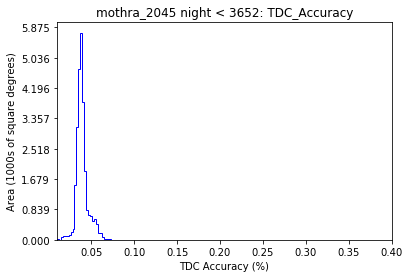

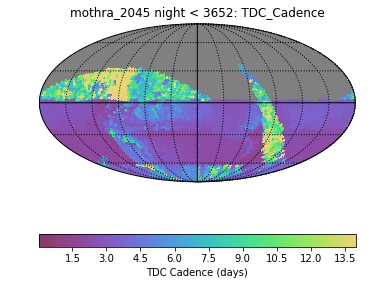

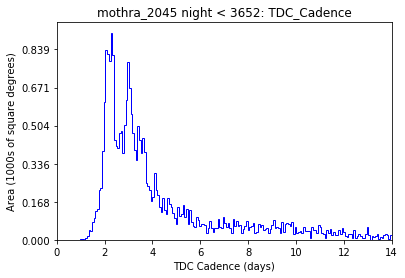

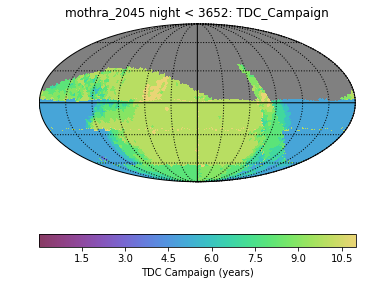

...

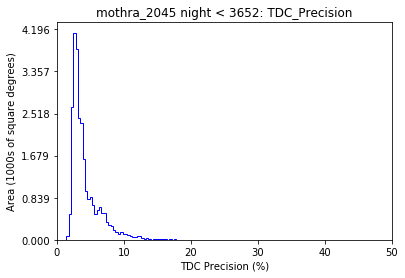

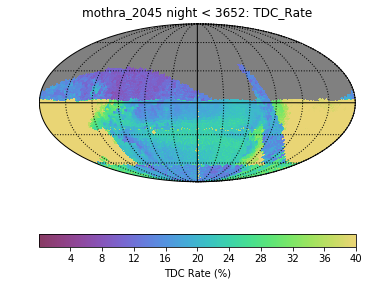

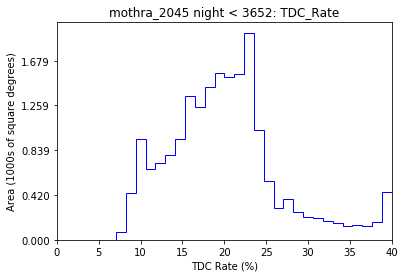

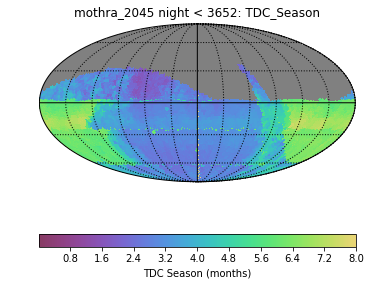

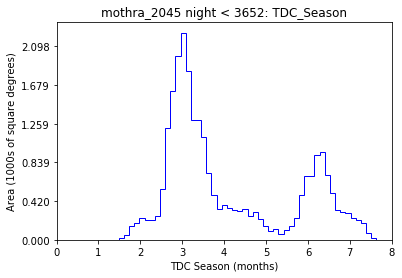

In [49]:
results.append(evaluate_opsim_run_for_time_delay_performance(runName='mothra_2045', Nyears=10, filters='ugrizy'))

#### `kraken_1043`: No Visit Pairs Required - 5 years, ugrizy

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 for columns ['night', 'fieldRA', 'observationStartMJD', 'fieldDec']


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 978997 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')


Plotting complete.
Fraction of total survey area providing high accuracy time delays =  1.2 %
Median night-to-night cadence in high accuracy regions =  2.7 days
Median season length in high accuracy regions =  6.1 months
Median campaign length in high accuracy regions =  6 years
Area of sky providing high accuracy time delays =  300 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  5.43 %
Number of lenses in high accuracy sample =  9
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  1.81 %


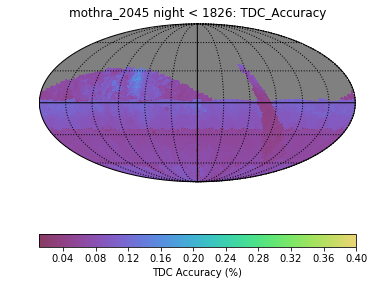

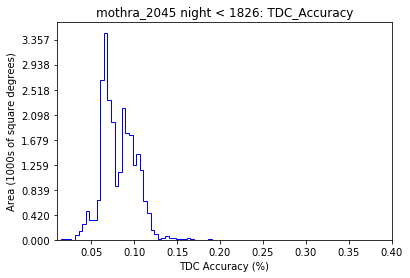

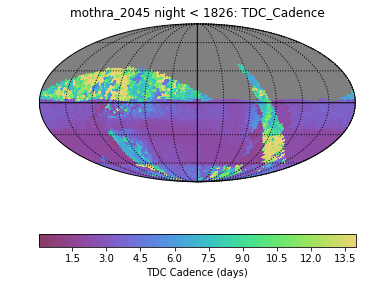

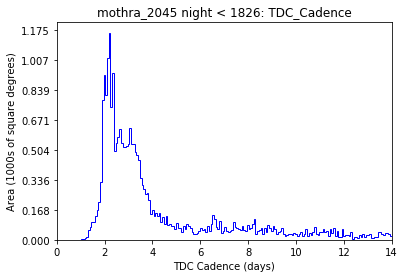

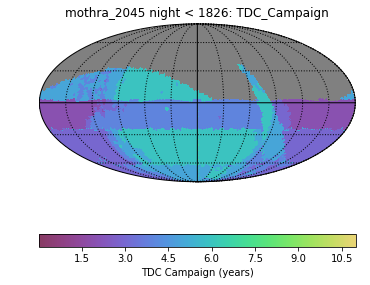

...

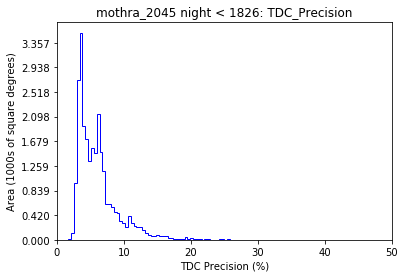

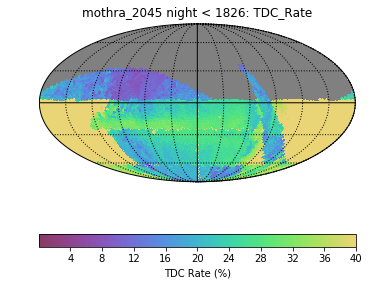

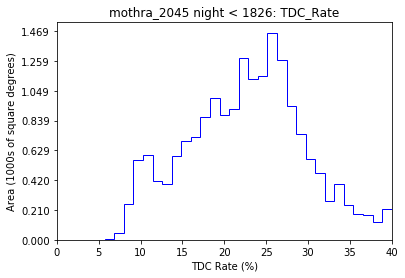

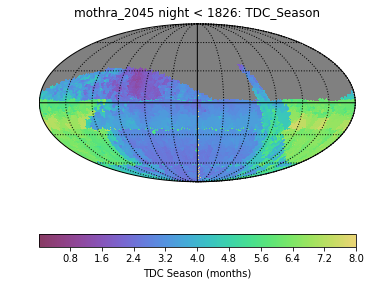

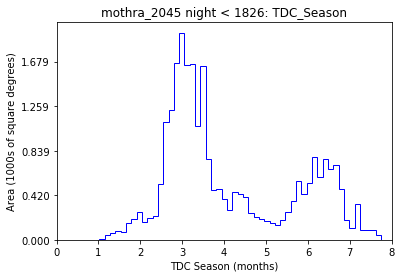

In [50]:
results.append(evaluate_opsim_run_for_time_delay_performance(runName='mothra_2045', Nyears=5, filters='ugrizy'))

#### `kraken_1043`: No Visit Pairs Required - 10 years, r+i only

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 3652 and (filter="i") for columns ['night', 'fieldRA', 'observationStartMJD', 'fieldDec']


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 348781 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 3652 and (filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')


Plotting complete.
Fraction of total survey area providing high accuracy time delays =  1.9 %
Median night-to-night cadence in high accuracy regions =  11.8 days
Median season length in high accuracy regions =  4.2 months
Median campaign length in high accuracy regions =  10 years
Area of sky providing high accuracy time delays =  492 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  8.6 %
Number of lenses in high accuracy sample =  5
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  3.85 %


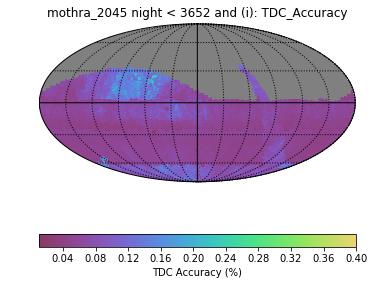

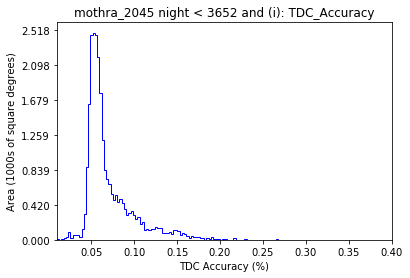

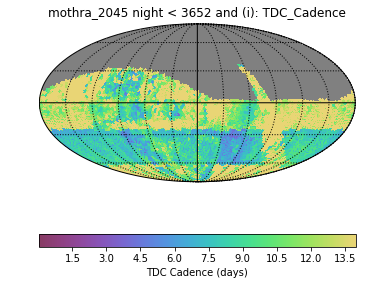

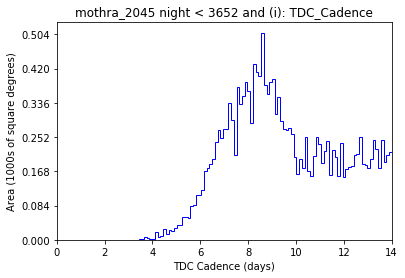

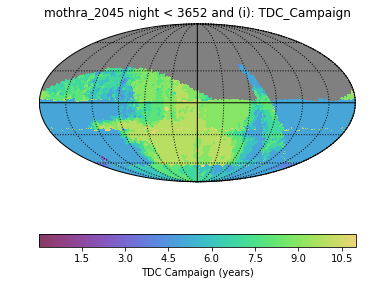

...

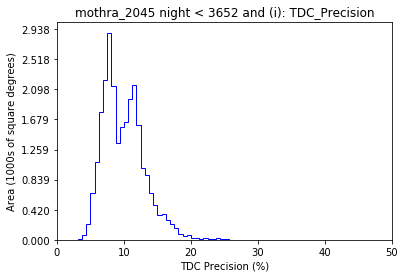

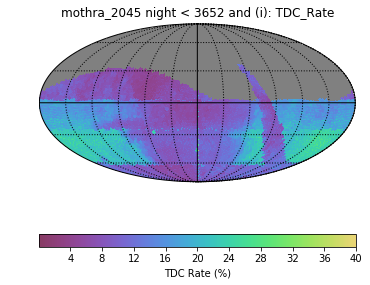

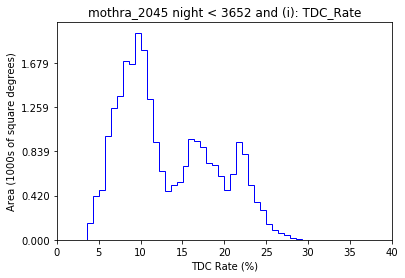

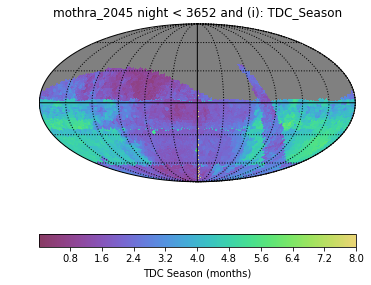

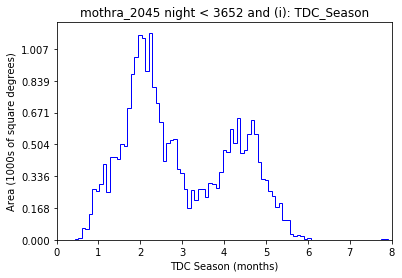

In [57]:
results.append(evaluate_opsim_run_for_time_delay_performance(runName='mothra_2045', Nyears=10, filters='i'))

#### `kraken_1043`: No Visit Pairs Required - 5 years, r+i only

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database SummaryAllProps with constraint night < 1826 and (filter="r" or filter="i") for columns ['night', 'fieldRA', 'observationStartMJD', 'fieldDec']


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/metricBundles/metricBundle.py:66: UserWarning: Future warning - "sqlconstraint" will be deprecated in favor of "constraint" in a future release.
  warnings.warn('Future warning - "sqlconstraint" will be deprecated in favor of '


Found 365850 visits
Running:  ['tdc']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Plotting figures with "night < 1826 and (filter="r" or filter="i")" constraint now.


/home/tanguita/lsst/stack/miniconda3-4.5.4-10a4fa6/Linux64/sims_maf/2.9.0.sims/python/lsst/sims/maf/plots/plotHandler.py:517: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn('Cannot plot object metric values with this plotter.')


Plotting complete.
Fraction of total survey area providing high accuracy time delays =  0.3 %
Median night-to-night cadence in high accuracy regions =  15.0 days
Median season length in high accuracy regions =  8.4 months
Median campaign length in high accuracy regions =  6 years
Area of sky providing high accuracy time delays =  66 sq deg
Mean precision per lens in high accuracy sample, including modeling error =  9.69 %
Number of lenses in high accuracy sample =  1
Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  9.69 %


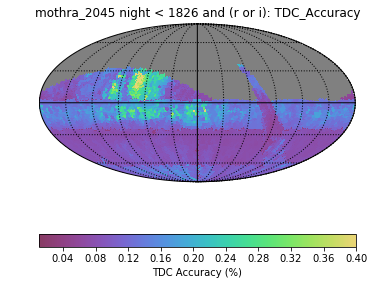

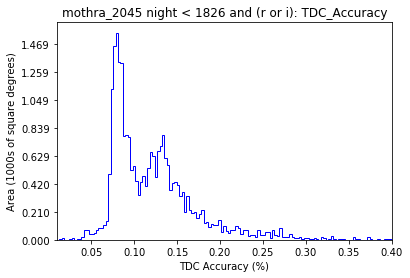

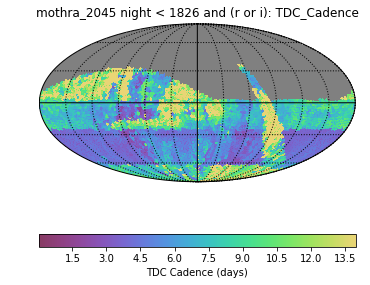

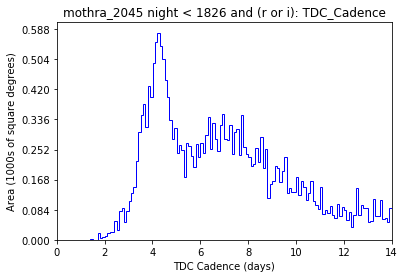

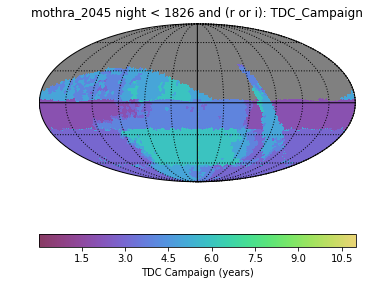

...

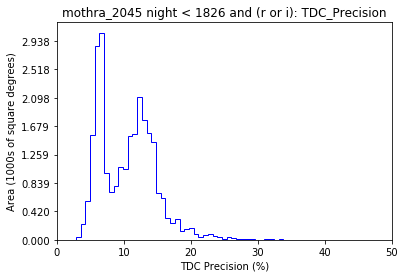

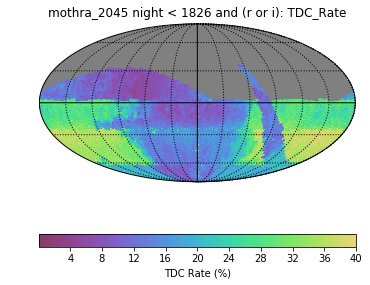

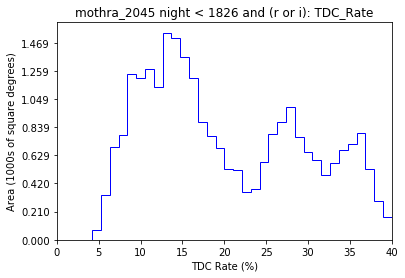

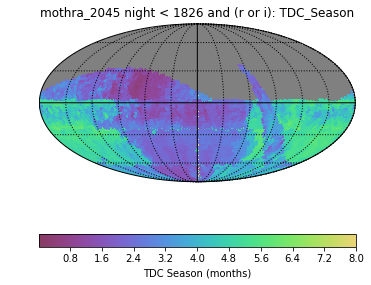

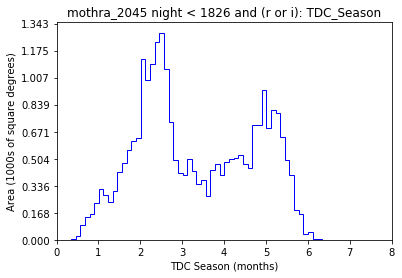

In [52]:
results.append(evaluate_opsim_run_for_time_delay_performance(runName='mothra_2045', Nyears=5, filters='ri'))

## Reporting the Results

For this we need to write a `latex` table.

In [ ]:
def make_latex_table(results):
    """
    Writes a latex table, with one row per test, presenting all the TDC metrics.
    
    Parameters
    ----------
    results : list(dict)
        List of results dictionaries, one per experiment.
        
    Returns
    -------
    None.
    
    Notes
    -----
    The latex code is written to a simple .tex file for \input into a document.
    
    Each element of the results list is a dictionary, like this:
    {'high_accuracy_season': 6.9118266805479518, 'high_accuracy_area': 19004.12600851645, 
     'high_accuracy_area_fraction': 70.67103620474407, 'precision_per_lens': 5.0872446140504994, 
     'N_lenses': 468, 'Nyears': 10, 'runName': 'minion_1016', 'filters': 'ugrizy', 
     'high_accuracy_cadence': 4.5279775970305893, 'distance_precision': 0.23515796547162932, 
     'high_accuracy_campaign': 10.0}
     
    The interpretation of these numbers is as follows:
    
    Fraction of total survey area providing high accuracy time delays =  70.7 %
    Median night-to-night cadence in high accuracy regions =  4.5 days
    Median season length in high accuracy regions =  6.9 months
    Median campaign length in high accuracy regions =  10 years
    Area of sky providing high accuracy time delays =  19004 sq deg
    Mean precision per lens in high accuracy sample, including modeling error =  5.09 %
    Number of lenses in high accuracy sample =  468
    Maximum combined percentage distance precision (as in Coe & Moustakas 2009) =  0.24 %

    "High accuracy" means Accuracy metric > 0.04 
    
    Which element of results is which?
    
    for k in range(len(results)):
       print k, results[k]['runName'], results[k]['filters'], results[k]['Nyears']

    0 minion_1016 ugrizy 10
    1 minion_1016 ugrizy 5
    2 minion_1016 ri 10
    3 minion_1016 ri 5
    4 kraken_1043 ugrizy 10
    5 kraken_1043 ugrizy 5
    6 kraken_1043 ri 10
    7 kraken_1043 ri 5

    """
    
    # Open file object: 
    texfile = 'table_lenstimedelays.tex'
    f = open(texfile, 'w')
    
    # Start latex:
    tex = r'''
\begin{table*}
\begin{center}
\caption{Lens Time Delay Metric Analysis Results.}
\label{tab:lenstimedelays:results}
\footnotesize
\begin{tabularx}{\linewidth}{ccccccccc}
  \hline
  \OpSim run                       % runName -> db
   & Filters                       % filters
    & Years                        % Nyears
     & \texttt{cadence}            % high_accuracy_cadence
      & \texttt{season}            % high_accuracy_season
       & \texttt{Area}             % high_accuracy_area
        & \texttt{dtPrecision}     % precision_per_lens
         & \texttt{Nlenses}        % N_lenses
          & \texttt{DPrecision} \\ % distance_precision
  \hline\hline'''
    f.write(tex)

    # Now write the table rows:
    for k in range(8):
        x = results[k]
        if x['runName'] == 'minion_1016':
            x['db'] = '\opsimdbref{db:baseCadence}'
        elif x['runName'] == 'kraken_1043':
            x['db'] = '\opsimdbref{db:NoVisitPairs}'
        else:
            raise ValueError('Unrecognized runName: '+x['runName'])
        tex = r'''
  {db}
   & ${filters}$
    & ${Nyears:.0f}$
     & ${high_accuracy_cadence:.1f}$
      & ${high_accuracy_season:.1f}$
       & ${high_accuracy_area:.0f}$
        & ${precision_per_lens:.2f}$
         & ${N_lenses:.0f}$
          & ${distance_precision:.2f}$ \\'''.format(**x)
        f.write(tex)
        
    # Now finish up the table:    
    tex = r'''
   \hline

\multicolumn{9}{p{\linewidth}}{\scriptsize Notes: see the text for
the definitions of each metric.}
\end{tabularx}
\normalsize
\medskip\\
\end{center}
\end{table*}'''
    
    # Write last part to file and close up:
    f.write(tex)
    f.close()
    
    # Report
    print("LaTeX table written to "+texfile)
    
    return

In [54]:
make_latex_table(results)

ValueError: Unrecognized runName: baseline2018a

In [ ]:
! cat table_lenstimedelays.tex

# Conclusions

We no have good diagnostic and Figure of Merit metrics for assessing lens time delay measurement, based on extrapolating the TDC1 single filter catalog-level simulations. We see that we are *analysis-limited* in the sense that *if* we can combine the *ugrizy* light curves with such fidelity that they appear as if we had simply undertaken a single filter monitoring withthe same cadence, then we can achieve the TDC1 results of 400 accurate measurements and 0.25% precision in time delay distance, and hence (roughly) $H_0$ - but if we cannot, then time delay cosmography will be significantly degraded and we would need additional monitoring data.